In [79]:
import mne
# import pyriemann
import numpy as np
import os
import joblib
import warnings
import matplotlib.patches as mpatches
from pyriemann.clustering import Potato, PotatoField
from pyriemann.estimation import Covariances
from pyriemann.classification import MDM
from copy import deepcopy
import matplotlib.pyplot as plt
mne.viz.set_browser_backend('matplotlib')

'matplotlib'

In [223]:
def mk_subplots(rows, cols, flatten=False, sz = [3, 3]):
	fig, axes = plt.subplots(rows, cols, figsize=(cols * sz[1], rows *  sz[0]))
	if flatten:
		axes = axes.flatten()
	return fig, axes


def plot_meg_topo(epochs, times, ax, ch_pick = 'mag', use_average = True):

	evoked = epochs.copy().pick(ch_pick)
	if use_average:
		evoked = evoked.average() # .apply_function(np.abs)
	evoked.plot_topomap(axes=ax, 
						show=False, 
						times = times,
						colorbar = False,
						cmap = 'RdBu_r'
						# sphere='extra'
						# sphere=0.1
						)
	

def plot_eeg_topo(epochs, times, ax, ch_pick = 'mag', use_average = True, use_abs = False):
	with warnings.catch_warnings():
		warnings.simplefilter("ignore")
		# suppress MNE logging (info, warning, etc.)
		with mne.use_log_level('ERROR'):  # only show critical errors

			evoked = epochs.copy().pick(ch_pick)

			if use_average:
				evoked = evoked.average()
			if use_abs:
				evoked = evoked.apply_function(np.abs)
			
			evoked.set_channel_types(dict(zip(evoked.ch_names, np.tile('eeg', len(evoked.ch_names)))), verbose=False)
			evoked.plot_topomap(
				times=times,
				axes=ax,
				ch_type="eeg",          # plot one sensor type only
				show=False,
				colorbar=False,
				outlines="head",        # try "head" instead of helmet-like outlines
				extrapolate="head",     # constrain interpolation to the head outline
				contours=6,
				sphere=0.17
			)
	 
def plot_best_evoked(epochs, idx, ax, color=None, ch_type='grad', do_avg = True, use_abs = True):
	evoked = epochs.copy().pick(ch_type)
	
	if do_avg:
		evoked = evoked.average()
	if use_abs:
		evoked = evoked.apply_function(np.abs)

	evoked_bestCh = evoked.copy()
	evoked_bestCh.pick([evoked.ch_names[i] for i in idx])
	times = evoked_bestCh.times
	ts = evoked_bestCh.data.mean(axis=0)

	ax.plot(times, ts, color = color)



In [3]:
conditions = [
    'NT/auditory/hit',
    'NT/auditory/miss',
    'NT/somato/hit',
    'NT/somato/miss',
    'NT/visual/hit',
    'NT/visual/miss',

    'HI/auditory',
    'HI/somato',
    'HI/visual',

    'catch/auditory',
    'catch/somato',
    'catch/visual',
]

conditions2 = [[			# grouped by sensory modality
	'HI/auditory',  
    'NT/auditory/hit',
    'NT/auditory/miss',
    'catch/auditory'],
    [
    'HI/somato',     
	'NT/somato/hit',
    'NT/somato/miss',
    'catch/somato'],
    [
	'HI/visual',   
	'NT/visual/hit',
    'NT/visual/miss',
    'catch/visual'],
]

HI_conditions = ['HI/auditory','HI/somato','HI/visual']
NT_hits = ['NT/auditory/hit','NT/somato/hit','NT/visual/hit']

titles = ['auditory', 'tactile', 'visual']

colors = dict(hit = 'darkgreen', miss = 'orange', HI = 'blue', catch = 'purple')

# 19970801cabd


Load data

In [3]:

# inFile = '/home/reabt/experiments/ncc/MEG/data/epochs_meg/20021027sldn_epo_meg.fif' #weird
# inFile = '/home/reabt/experiments/ncc/MEG/data/epochs_meg/19970801cabd_epo_meg.fif'

# from ~~epochs_all_conditions~~
subjectID = '19970801cabd'
# subjectID = '19910823ssld'

inFile = f'/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/{subjectID}/{subjectID}_maxfilter_True__ica_True__l_pass_30__downsample_f_100__h_pass_0.1_meg-epo.fif'


In [4]:
epochs = mne.read_epochs(inFile)

Reading /home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/19970801cabd/19970801cabd_maxfilter_True__ica_True__l_pass_30__downsample_f_100__h_pass_0.1_meg-epo.fif ...
    Found the data of interest:
        t =   -1000.00 ...    1000.00 ms
        0 CTF compensation matrices available
Reading /home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/19970801cabd/19970801cabd_maxfilter_True__ica_True__l_pass_30__downsample_f_100__h_pass_0.1_meg-epo.fif ...
    Found the data of interest:
        t =   -1000.00 ...    1000.00 ms
        0 CTF compensation matrices available
Not setting metadata
1440 matching events found
No baseline correction applied
0 projection items activated


plot all 24*3 conditions


In [ ]:

evoked_dict = {condition: epochs[condition].average() for condition in epochs.event_id}

for condition, evoked in evoked_dict.items():
    evoked.plot(titles=f'Evoked: {condition}')

In [9]:
#%% --- make a list of of epochs by condition, if the conditions exists in the data

evoked_list = []
for condition in conditions:
    print(condition)
    evoked_list.append([epochs[key].average() for key in epochs.event_id.keys() if condition in key])

valid_conditions = [c for c, evo in zip(conditions, evoked_list) if evo != []] # --- remove non-existing conditions
evoked_list = [x for x in evoked_list if x != []]


NT/auditory/hit
NT/auditory/miss
NT/somato/hit
NT/somato/miss
NT/visual/hit
NT/visual/miss
HI/auditory
HI/somato
HI/visual
catch/auditory
catch/somato
catch/visual


plot all conditions inb single plots

In [ ]:
# for condition, evo in zip(valid_conditions, evoked_list):
#     evoked.pick('mag').plot(titles=f'Evoked: {condition}')

plot all conditions in subplots

/tmp/ipykernel_1765254/691660440.py:7: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


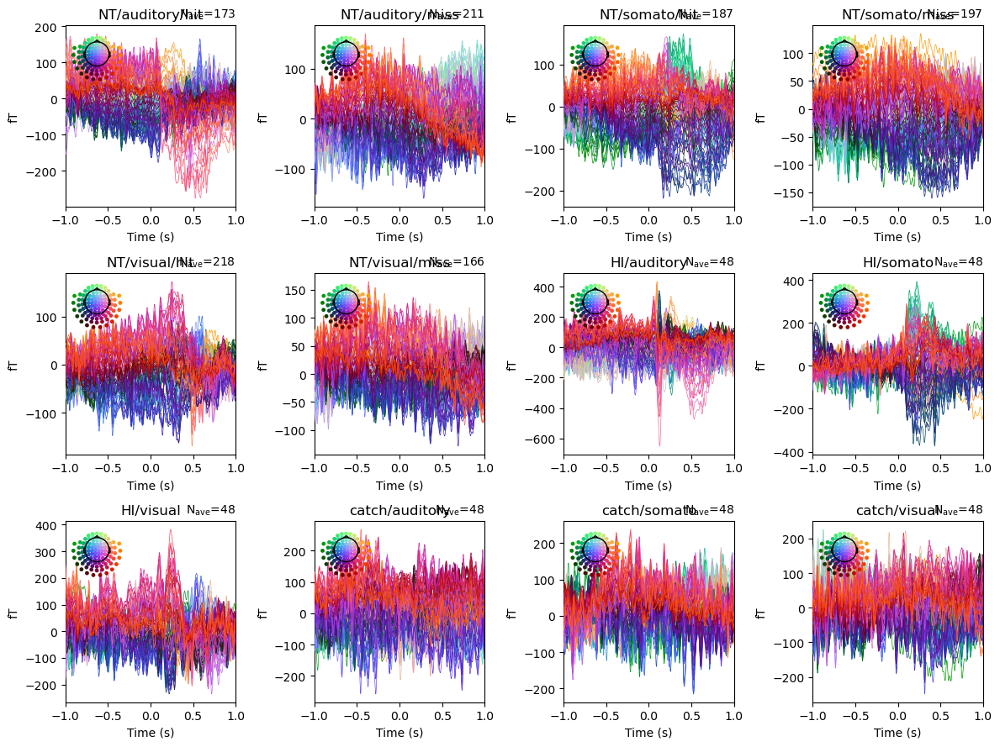

In [11]:
fig, axes = mk_subplots(3, 4, True)
for n, condition in enumerate(valid_conditions):
    evoked = epochs[condition].copy().pick('mag').average()
    evoked.plot(axes=axes[n], show=False)
    axes[n].set_title(condition) # set subplot title manually with matplotlib

plt.tight_layout()
plt.show()

rectify data after averaging

In [ ]:
fig, axes = mk_subplots(1, 4, True)
for n, condition in enumerate(valid_conditions[0:4]):
    evoked = epochs[condition].copy().pick('mag').average().apply_function(np.abs)
    evoked.plot(axes=axes[n], show=False, window_title=condition)
    axes[n].set_title(condition)

plt.tight_layout()
plt.show()

plot topo-map

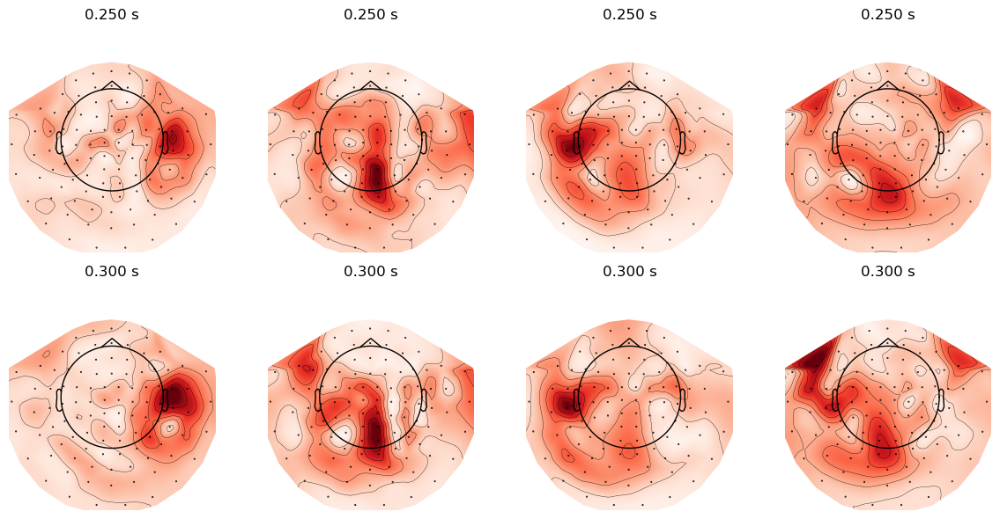

In [12]:
times = [0.25, 0.3]
fig, axes = mk_subplots(len(times), 4, False) #rows = len(times) # +1 (only if colorbar = True)
for n, condition in enumerate(valid_conditions[0:4]):
    evoked = epochs[condition].copy().pick('grad').average() # .apply_function(np.abs)
    evoked.plot_topomap(axes=axes[:,n], 
                        show=False, 
                        times = times,
                        colorbar = False)
plt.tight_layout()
plt.show()

 plot topo-ERFs

/tmp/ipykernel_1765254/3367964503.py:6: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


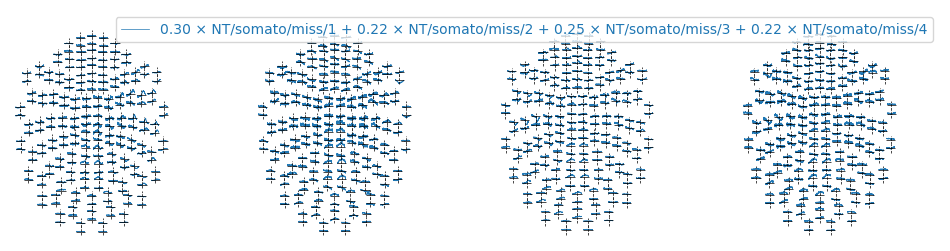

In [13]:
fig, axes = mk_subplots(1, 4, False)
for n, condition in enumerate(valid_conditions[0:4]):
    evoked = epochs[condition].copy().pick('grad').average() # .apply_function(np.abs)
    evoked.plot_topo(axes=axes[n], 
                        show=False)
plt.tight_layout()
plt.show()

plot grads + mags

/tmp/ipykernel_1765254/4130014025.py:9: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


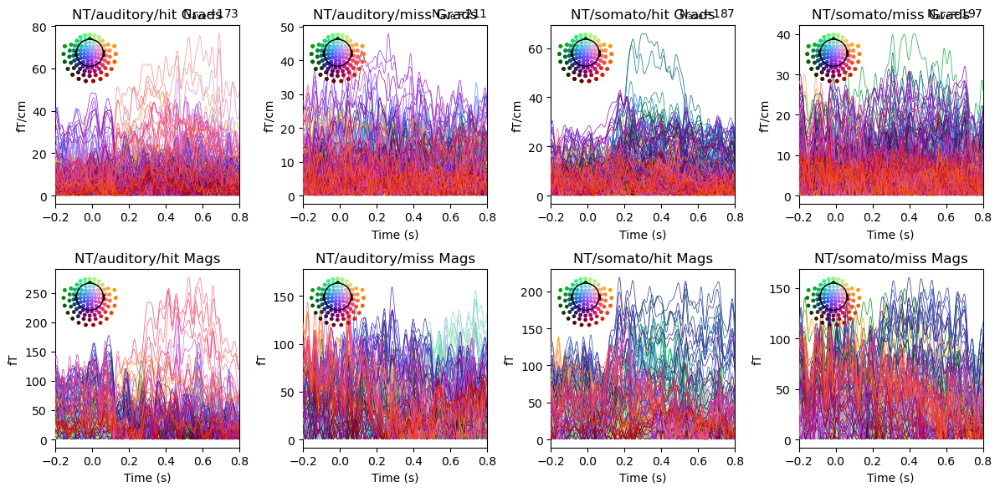

In [14]:
fig, axes = mk_subplots(2, 4, False)
for n, condition in enumerate(valid_conditions[0:4]):
    evoked = epochs[condition].copy().pick('meg').average().apply_function(np.abs)
    evoked.plot(axes=axes[:,n], show=False, xlim =(-0.2, 0.8))

    # set subplot title manually with matplotlib
    axes[0,n].set_title(f'{condition} Grads')
    axes[1,n].set_title(f'{condition} Mags')
plt.tight_layout()
plt.show()

plot grads + mags --> try to plot channels with highest evoked response

Need more than one channel to make topography for grad. Disabling interactivity.
Need more than one channel to make topography for grad. Disabling interactivity.
Need more than one channel to make topography for grad. Disabling interactivity.
Need more than one channel to make topography for grad. Disabling interactivity.


/tmp/ipykernel_1765254/2515491624.py:18: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


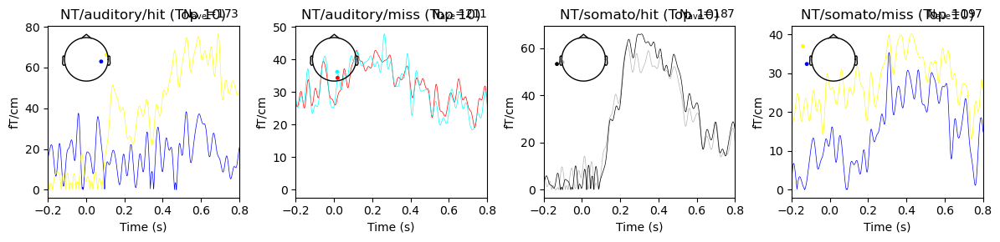

/tmp/ipykernel_1765254/2515491624.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


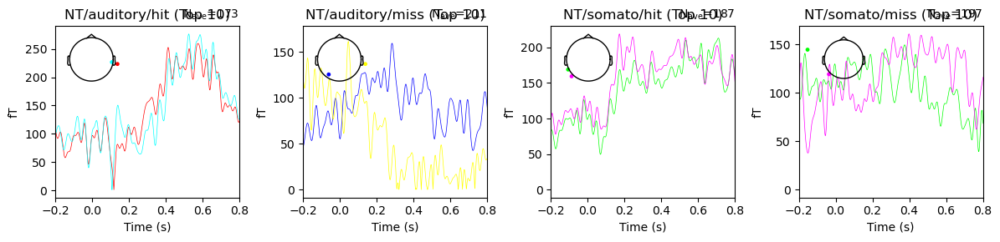

In [18]:
n_best = 2
fig, axes = mk_subplots(1, 4, False)

for n, condition in enumerate(valid_conditions[0:4]):
    evoked = epochs[condition].copy().pick('grad').average().apply_function(np.abs)
    
    # Get data and find top 10 channels by max activity
    data = evoked.data
    max_activity = np.max(np.abs(data), axis=1)
    bestCh_idx = np.argsort(max_activity)[-n_best:]
    
    # Create a copy with only top 10 channels
    evoked_bestCh = evoked.copy()
    evoked_bestCh.pick([evoked.ch_names[i] for i in bestCh_idx])
    evoked_bestCh.plot(axes=axes[n], show=False, xlim=(-0.2, 0.8))
    axes[n].set_title(f'{condition} (Top 10)')

plt.tight_layout()
plt.show()


n_best = 2
fig, axes = mk_subplots(1, 4, False)

for n, condition in enumerate(valid_conditions[0:4]):
    evoked = epochs[condition].copy().pick('mag').average().apply_function(np.abs)
    
    # Get data and find top 10 channels by max activity
    data = evoked.data
    max_activity = np.max(np.abs(data), axis=1)
    bestCh_idx = np.argsort(max_activity)[-n_best:]
    
    # Create a copy with only top 10 channels
    evoked_bestCh = evoked.copy()
    evoked_bestCh.pick([evoked.ch_names[i] for i in bestCh_idx])
    evoked_bestCh.plot(axes=axes[n], show=False, xlim=(-0.2, 0.8))
    axes[n].set_title(f'{condition} (Top 10)')

plt.tight_layout()
plt.show()


## Trying to do overview plot

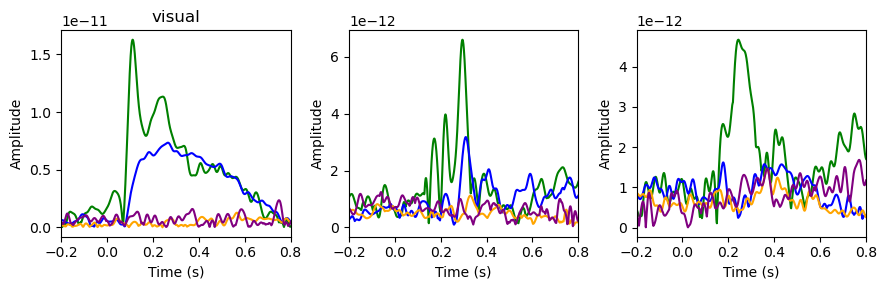

In [43]:

n_best = 2
fig, axes = mk_subplots(1, 3, False)

for n, (modality, mod_name) in enumerate(zip(conditions2, titles)):

	for n_cond, (condition,c) in enumerate(zip(modality, colors)):

		evoked = epochs[condition].copy().pick('grad').average().apply_function(np.abs)

		# Get data and find top 10 channels by max activity
		data = evoked.data
		if n_cond == 0: # use channels with highest evoked respnse in HI trials
			max_activity = np.max(np.abs(data), axis=1)
			bestCh_idx = np.argsort(max_activity)[-n_best:]

		# Create a copy with only top 10 channels
		evoked_bestCh = evoked.copy()
		evoked_bestCh.pick([evoked.ch_names[i] for i in bestCh_idx])
		times = evoked_bestCh.times
		ts = evoked_bestCh.data.mean(axis=0)

		axes[n].plot(times, ts, color = c)
		axes[0].set_title(mod_name)
		axes[n].set_xlabel('Time (s)')
		axes[n].set_ylabel('Amplitude')
		axes[n].set_xlim(-0.2, 0.8)
plt.tight_layout()
plt.show()

## Trying to style plots

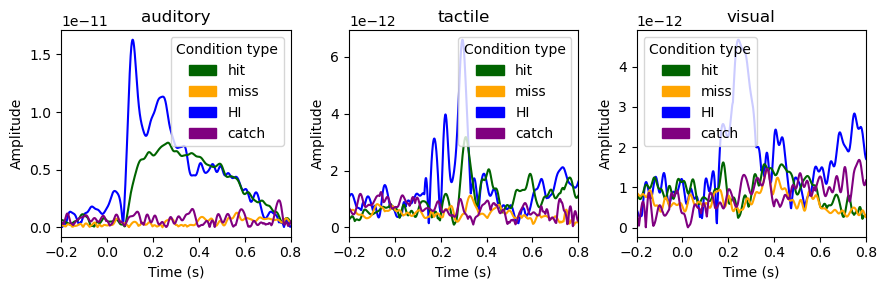

In [5]:
n_best = 2
fig, axes = mk_subplots(1, 3, False)

for n, (modality, mod_name) in enumerate(zip(conditions2, titles)):

	# for n_cond, (condition,c) in enumerate(zip(modality, colors)):
	for n_cond, condition in enumerate(modality):

		thisColor = next((v for k, v in colors.items() if k in condition), None)

		evoked = epochs[condition].copy().pick('grad').average().apply_function(np.abs)

		# Get data and find top 10 channels by max activity
		data = evoked.data
		if n_cond == 0: # use channels with highest evoked respnse in HI trials
			max_activity = np.max(np.abs(data), axis=1)
			bestCh_idx = np.argsort(max_activity)[-n_best:]

		# Create a copy with only top 10 channels
		evoked_bestCh = evoked.copy()
		evoked_bestCh.pick([evoked.ch_names[i] for i in bestCh_idx])
		times = evoked_bestCh.times
		ts = evoked_bestCh.data.mean(axis=0)

		axes[n].plot(times, ts, color = thisColor)
	axes[n].set_title(mod_name)
	axes[n].set_xlabel('Time (s)')
	axes[n].set_ylabel('Amplitude')
	axes[n].set_xlim(-0.2, 0.8)
# plt.tight_layout()
# plt.show()

import matplotlib.patches as mpatches

legend_handles = [mpatches.Patch(color=c, label=k) for k, c in colors.items()]
for ax in axes:
	ax.legend(handles=legend_handles, title='Condition type')


plt.tight_layout()
plt.show()

/tmp/ipykernel_1772686/774483338.py:23: RuntimeWarning: The unit for channel(s) MEG0111, MEG0121, MEG0131, MEG0141, MEG0211, MEG0221, MEG0231, MEG0241, MEG0311, MEG0321, MEG0331, MEG0341, MEG0411, MEG0421, MEG0431, MEG0441, MEG0511, MEG0521, MEG0531, MEG0541, MEG0611, MEG0621, MEG0631, MEG0641, MEG0711, MEG0721, MEG0731, MEG0741, MEG0811, MEG0821, MEG0911, MEG0921, MEG0931, MEG0941, MEG1011, MEG1021, MEG1031, MEG1041, MEG1111, MEG1121, MEG1131, MEG1141, MEG1211, MEG1221, MEG1231, MEG1241, MEG1311, MEG1321, MEG1331, MEG1341, MEG1411, MEG1421, MEG1431, MEG1441, MEG1511, MEG1521, MEG1531, MEG1541, MEG1611, MEG1621, MEG1631, MEG1641, MEG1711, MEG1721, MEG1731, MEG1741, MEG1811, MEG1821, MEG1831, MEG1841, MEG1911, MEG1921, MEG1931, MEG1941, MEG2011, MEG2021, MEG2031, MEG2041, MEG2111, MEG2121, MEG2131, MEG2141, MEG2211, MEG2221, MEG2231, MEG2241, MEG2311, MEG2321, MEG2331, MEG2341, MEG2411, MEG2421, MEG2431, MEG2441, MEG2511, MEG2521, MEG2531, MEG2541, MEG2611, MEG2621, MEG2631, MEG2641 has

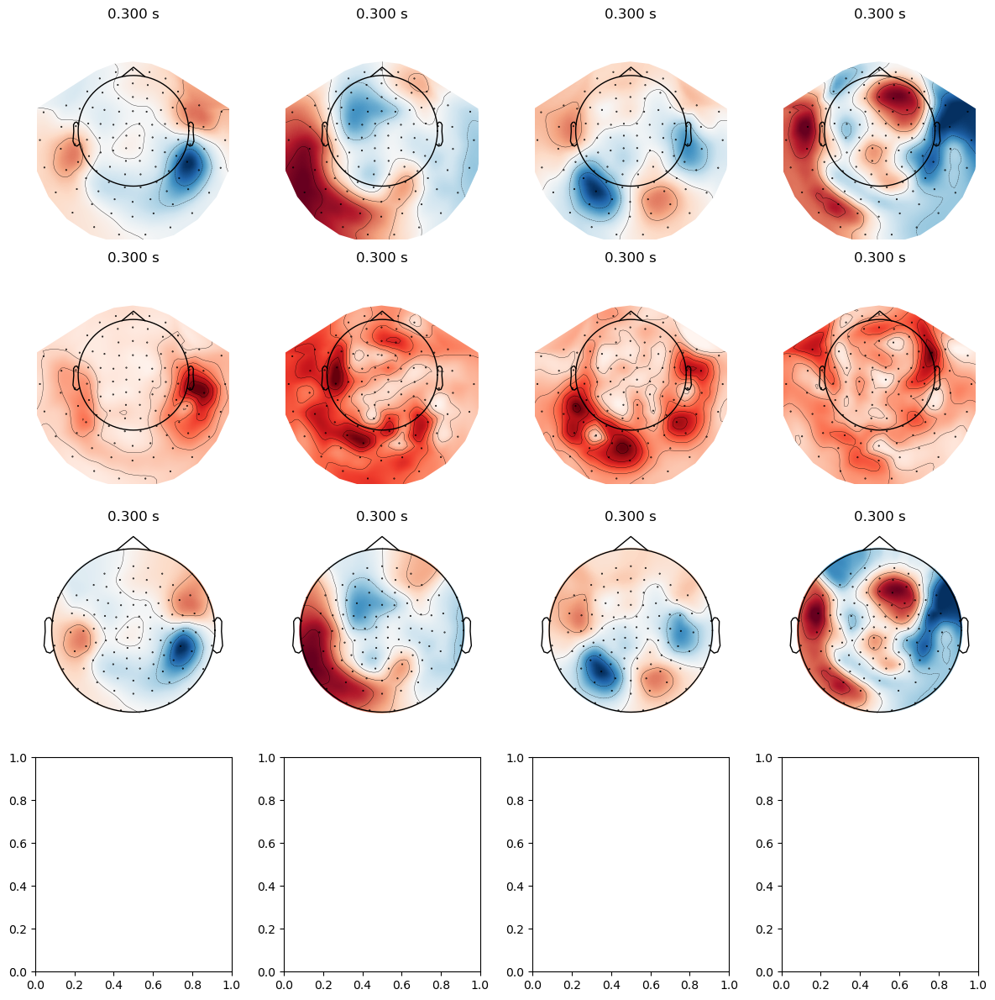

In [ ]:

times = [0.3]
fig, axes = mk_subplots(4, 4, False) #rows = len(times) # +1 (only if colorbar = True)

for n, condition in enumerate(conditions[0:4]):    
    plot_meg_topo(epochs[condition], times, ax=axes[0,n], ch_pick = 'mag')   # MEG-style magnetometer

for n, condition in enumerate(conditions[0:4]):    
    plot_meg_topo(epochs[condition], times, ax=axes[1,n], ch_pick = 'grad')	 # MEG-style gradiometer

for n, condition in enumerate(conditions[0:4]):    
    plot_eeg_topo(epochs[condition], times, ax=axes[2,n], ch_pick = 'mag')	# EEG-style magnetometer

for n, condition in enumerate(conditions[0:4]):    
    plot_eeg_topo(epochs[condition], times, ax=axes[3,n], ch_pick = 'grad')	# EEG-style gradiometer --> cannot be plotted because of overlaping positions
    
plt.tight_layout()
plt.show()

In [92]:

titles = ['auditory', 'tactile', 'visual']

# colors = ['green', 'blue', 'orange', 'purple']

colors = dict(hit = 'darkgreen', miss = 'orange', HI = 'blue', catch = 'purple')

conditions2 = [[
	'HI/auditory',  
    'NT/auditory/hit',
    'NT/auditory/miss',
    'catch/auditory'],
    [
    'HI/somato',     
	'NT/somato/hit',
    'NT/somato/miss',
    'catch/somato'],
    [
	'HI/visual',   
	'NT/visual/hit',
    'NT/visual/miss',
    'catch/visual'],
]


HI_conditions = ['HI/auditory','HI/somato','HI/visual']
NT_hits = ['NT/auditory/hit','NT/somato/hit','NT/visual/hit']

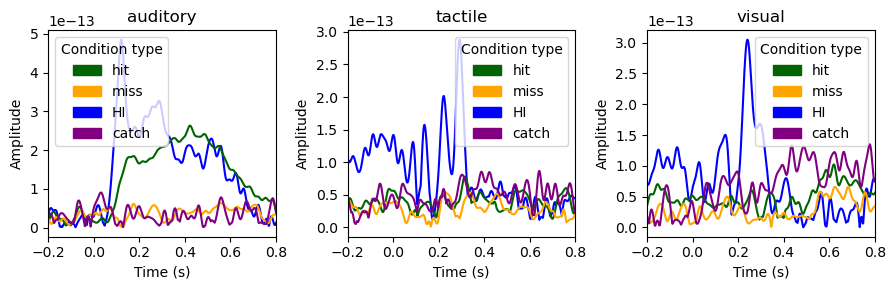

In [ ]:
fig, axes = mk_subplots(1, 3, False)

for n, (modality, mod_name) in enumerate(zip(conditions2, titles)):

	# get indices of best channels
	evoked = epochs[modality[0]].copy().pick('mag').average().apply_function(np.abs)
	max_activity = np.max(np.abs( evoked.data), axis=1)
	bestCh_idx = np.argsort(max_activity)[-n_best:]

	# for n_cond, (condition,c) in enumerate(zip(modality, colors)):
	for n_cond, condition in enumerate(modality):
		ax = axes[n]
		thisColor = next((v for k, v in colors.items() if k in condition), None)

		plot_best_evoked(epochs[condition], bestCh_idx, ax, color=thisColor, ch_type='mag', do_avg = True, use_abs = True)

	ax.set_title(mod_name)
	ax.set_xlabel('Time (s)')
	ax.set_ylabel('Amplitude')
	ax.set_xlim(-0.2, 0.8)

legend_handles = [mpatches.Patch(color=c, label=k) for k, c in colors.items()]
for ax in axes:
	ax.legend(handles=legend_handles, title='Condition type')

plt.tight_layout()
plt.show()

/tmp/ipykernel_1772686/3421025947.py:23: RuntimeWarning: The unit for channel(s) MEG0111, MEG0121, MEG0131, MEG0141, MEG0211, MEG0221, MEG0231, MEG0241, MEG0311, MEG0321, MEG0331, MEG0341, MEG0411, MEG0421, MEG0431, MEG0441, MEG0511, MEG0521, MEG0531, MEG0541, MEG0611, MEG0621, MEG0631, MEG0641, MEG0711, MEG0721, MEG0731, MEG0741, MEG0811, MEG0821, MEG0911, MEG0921, MEG0931, MEG0941, MEG1011, MEG1021, MEG1031, MEG1041, MEG1111, MEG1121, MEG1131, MEG1141, MEG1211, MEG1221, MEG1231, MEG1241, MEG1311, MEG1321, MEG1331, MEG1341, MEG1411, MEG1421, MEG1431, MEG1441, MEG1511, MEG1521, MEG1531, MEG1541, MEG1611, MEG1621, MEG1631, MEG1641, MEG1711, MEG1721, MEG1731, MEG1741, MEG1811, MEG1821, MEG1831, MEG1841, MEG1911, MEG1921, MEG1931, MEG1941, MEG2011, MEG2021, MEG2031, MEG2041, MEG2111, MEG2121, MEG2131, MEG2141, MEG2211, MEG2221, MEG2231, MEG2241, MEG2311, MEG2321, MEG2331, MEG2341, MEG2411, MEG2421, MEG2431, MEG2441, MEG2511, MEG2521, MEG2531, MEG2541, MEG2611, MEG2621, MEG2631, MEG2641 ha

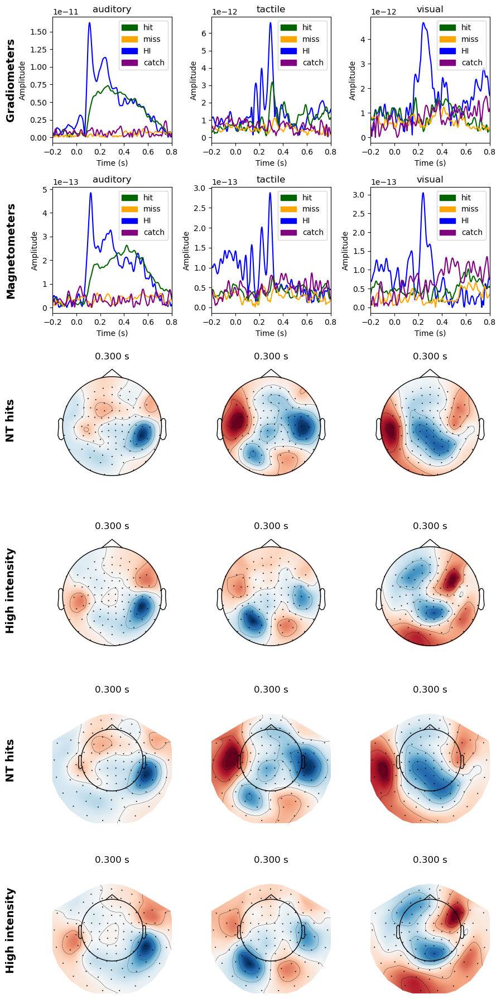

In [ ]:
fig, axes = mk_subplots(6, 3, False)

legend_handles = [mpatches.Patch(color=c, label=k) for k, c in colors.items()]

for n, (modality, mod_name) in enumerate(zip(conditions2, titles)): # plot Evoked of best Gradiometers
	ax = axes[0,n]
	# get indices of best channels
	evoked = epochs[modality[0]].copy().pick('grad').average().apply_function(np.abs)
	max_activity = np.max(np.abs( evoked.data), axis=1)
	bestCh_idx = np.argsort(max_activity)[-n_best:]

	# for n_cond, (condition,c) in enumerate(zip(modality, colors)):
	for n_cond, condition in enumerate(modality):
		
		thisColor = next((v for k, v in colors.items() if k in condition), None)

		plot_best_evoked(epochs[condition], bestCh_idx, ax, color=thisColor, ch_type='grad', do_avg = True, use_abs = True)

	ax.set_title(mod_name)
	ax.set_xlabel('Time (s)')
	ax.set_ylabel('Amplitude')
	ax.set_xlim(-0.2, 0.8)
	ax.legend(handles=legend_handles)

for n, (modality, mod_name) in enumerate(zip(conditions2, titles)): # plot Evoked of best Magnetometers
	ax = axes[1,n]
	# get indices of best channels
	evoked = epochs[modality[0]].copy().pick('mag').average().apply_function(np.abs)
	max_activity = np.max(np.abs( evoked.data), axis=1)
	bestCh_idx = np.argsort(max_activity)[-n_best:]

	# for n_cond, (condition,c) in enumerate(zip(modality, colors)):
	for n_cond, condition in enumerate(modality):
		
		thisColor = next((v for k, v in colors.items() if k in condition), None)

		plot_best_evoked(epochs[condition], bestCh_idx, ax, color=thisColor, ch_type='mag', do_avg = True, use_abs = True)

	ax.set_title(mod_name)
	ax.set_xlabel('Time (s)')
	ax.set_ylabel('Amplitude')
	ax.set_xlim(-0.2, 0.8)
	ax.legend(handles=legend_handles)

times = [0.3]

for n, condition in enumerate(HI_conditions):    
    plot_eeg_topo(epochs[condition], times, ax=axes[2,n], ch_pick = 'mag')	# EEG-style magnetometer
    
for n, condition in enumerate(NT_hits):    
    plot_eeg_topo(epochs[condition], times, ax=axes[3,n], ch_pick = 'mag')	# EEG-style magnetometer

for n, condition in enumerate(HI_conditions):    
    plot_meg_topo(epochs[condition], times, ax=axes[4,n], ch_pick = 'mag')   # MEG-style magnetometer
    
for n, condition in enumerate(NT_hits):    
    plot_meg_topo(epochs[condition], times, ax=axes[5,n], ch_pick = 'mag')   # MEG-style magnetometer
    

anot_strings = ['Gradiometers',
				'Magnetometers', 
				'NT hits', 'High intensity', 
				'NT hits', 'High intensity']

for n, anot in enumerate(anot_strings):
	axes[n,0].text(-0.35, 0.5, anot, transform=axes[n,0].transAxes,
				   rotation=90, va='center', ha='center', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

# Grand Average

In [123]:
inFile = '/home/reabt/experiments/ncc/MEG/Fabi/tmp_outputs/grand_average_evoked_maxfilter_True__ica_True__l_pass_30__downsample_f_100__h_pass_0.1_meg-epo.pkl'
# evoked = mne.read_epochs(inFile)
evoked_loaded = joblib.load(inFile)

In [ ]:
evoked = deepcopy(evoked_loaded)

In [ ]:
# def plot_best_evoked(grand_avg, idx, ax, color=None, ch_type='grad', do_avg = False, use_abs = True):
	
# 	evoked_bestCh = grand_avg.copy().pick(ch_type).apply_function(np.abs)

# 	evoked_bestCh.pick([evoked_bestCh.ch_names[i] for i in idx])
# 	times = evoked_bestCh.times
# 	ts = evoked_bestCh.data.mean(axis=0)
# 	ax.plot(times, ts, color = color)

Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...


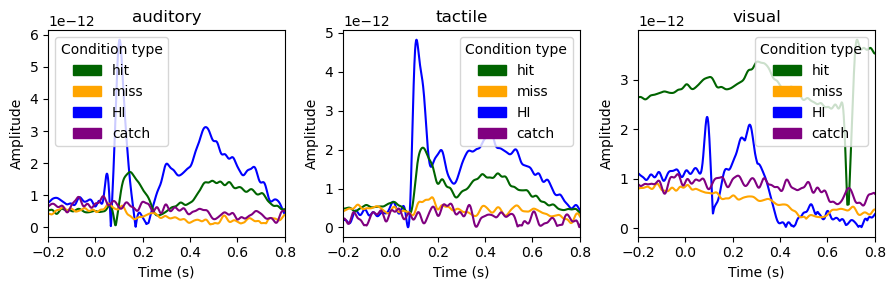

In [146]:
n_best = 2
ch_type = 'grad'
all_subj = os.listdir('/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/')
badSubj = ['20021027sldn']
fig, axes = mk_subplots(1, 3, False)

for n, (modality, mod_name) in enumerate(zip(conditions2, titles)):

	# ga_mod = mne.grand_average([evo[modality[0]] for evo in evoked if evo])

	ga_mod = mne.grand_average([evo[modality[0]] for evo, subjID in zip(evoked, all_subj) if (evo and subjID not in badSubj)])
	# get indices of best channels
	evoked_mod = ga_mod.copy().pick(ch_type)#.apply_function(np.abs)
	max_activity = np.max(np.abs( evoked_mod.data), axis=1)
	bestCh_idx = np.argsort(max_activity)[-n_best:]

	for n_cond, condition in enumerate(modality):
		# print(condition)

		ga_cond = mne.grand_average([evo[condition] for evo in evoked if evo])
		ax = axes[n]
		thisColor = next((v for k, v in colors.items() if k in condition), None)

		plot_best_evoked(ga_cond, bestCh_idx, ax, color=thisColor, ch_type=ch_type, do_avg = False, use_abs = True)

	ax.set_title(mod_name)
	ax.set_xlabel('Time (s)')
	ax.set_ylabel('Amplitude')
	ax.set_xlim(-0.2, 0.8)

legend_handles = [mpatches.Patch(color=c, label=k) for k, c in colors.items()]
for ax in axes:
	ax.legend(handles=legend_handles, title='Condition type')

plt.tight_layout()
plt.show()

## trying to plot single subjects

In [112]:
evoked[28][modality[0]].pick(ch_type)

<Evoked | '0.25 × HI/auditory/hit/1 + 0.25 × HI/auditory/hit/2 + 0.25 × HI/auditory/hit/3 + 0.25 × HI/auditory/hit/4' (average, N=48), -1 – 1 s, baseline off, 102 ch, ~8.1 MiB>

### single subject for testing stuff

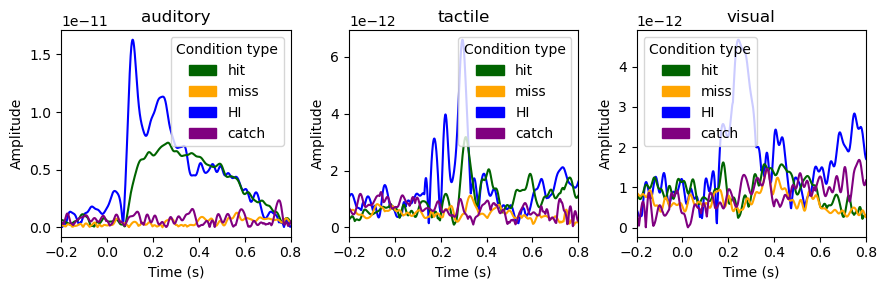

In [133]:
evoked = deepcopy(evoked_loaded)

ch_type = 'grad'

subj = evoked[28]

fig, axes = mk_subplots(1, 3, False)

for n, (modality, mod_name) in enumerate(zip(conditions2, titles)):

	# get indices of best channels
	# evo = subj[modality[0]].copy().pick(ch_type).average().apply_function(np.abs)
	evo = subj[modality[0]].copy().pick(ch_type)
	max_activity = np.max(np.abs(evo.data), axis=1)
	bestCh_idx = np.argsort(max_activity)[-n_best:]

	# for n_cond, (condition,c) in enumerate(zip(modality, colors)):
	for n_cond, condition in enumerate(modality):
		ax = axes[n]
		thisColor = next((v for k, v in colors.items() if k in condition), None)
		# plot_best_evoked_abs(epochs, condition, bestCh_idx, ax, color=thisColor, ch_type='mag')
		plot_best_evoked(subj[condition], bestCh_idx, ax, color=thisColor, ch_type=ch_type, do_avg = False, use_abs = True)

	ax.set_title(mod_name)
	ax.set_xlabel('Time (s)')
	ax.set_ylabel('Amplitude')
	ax.set_xlim(-0.2, 0.8)

legend_handles = [mpatches.Patch(color=c, label=k) for k, c in colors.items()]
for ax in axes:
	ax.legend(handles=legend_handles, title='Condition type')

plt.tight_layout()
plt.show()

### ERPs all subj individually

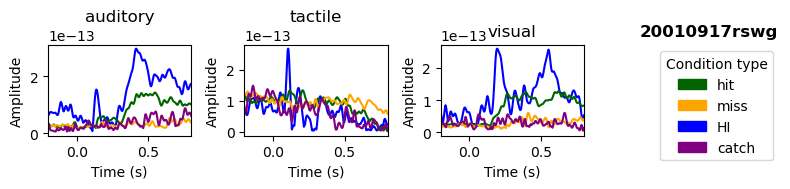

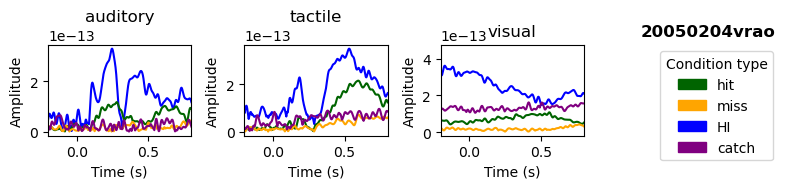

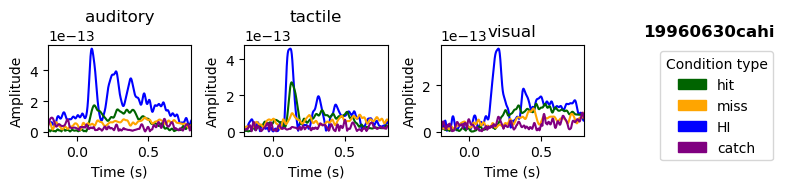

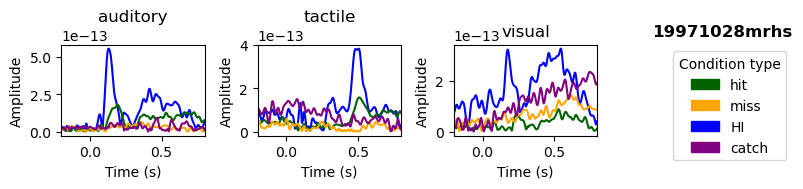

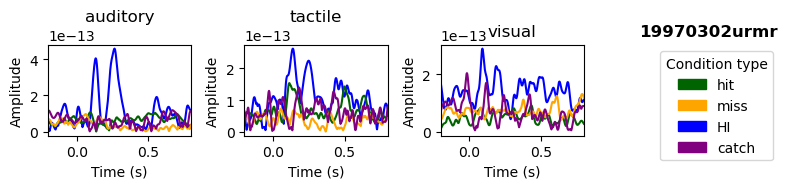

...

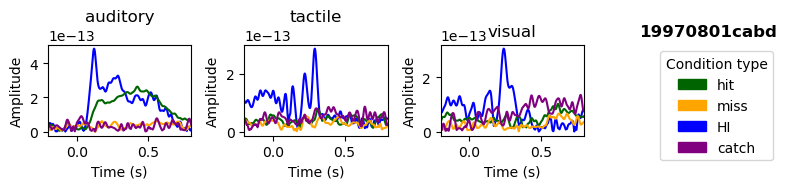

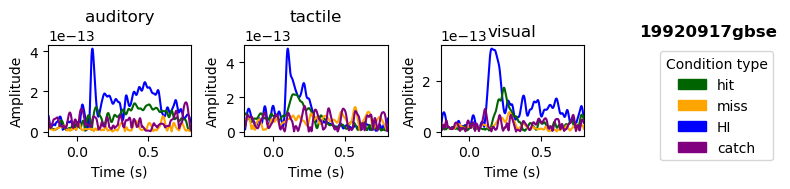

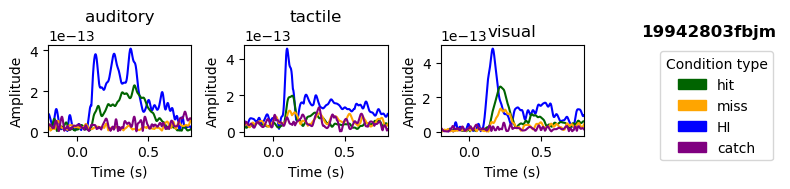

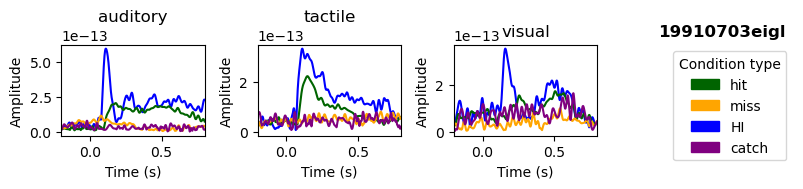

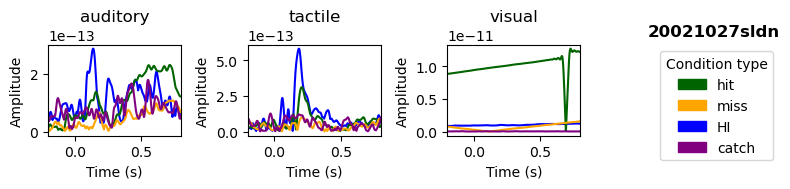

In [145]:
ch_type = 'mag'

all_subj = os.listdir('/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/')

for subj, sub_ID in zip(evoked, all_subj):
	if subj:
		fig, axes = mk_subplots(1, 4, False, sz = [2, 2])
		# fig.suptitle(sub_ID)

		for n, (modality, mod_name) in enumerate(zip(conditions2, titles)):

			# get indices of best channels
			# evo = subj[modality[0]].copy().pick(ch_type).average().apply_function(np.abs)
			evo = subj[modality[0]].copy().pick(ch_type).apply_function(np.abs)

			max_activity = np.max(np.abs(evo.data), axis=1)
			bestCh_idx = np.argsort(max_activity)[-n_best:]

			# for n_cond, (condition,c) in enumerate(zip(modality, colors)):
			for n_cond, condition in enumerate(modality):
				ax = axes[n]
				thisColor = next((v for k, v in colors.items() if k in condition), None)
				plot_best_evoked(subj[condition], bestCh_idx, ax, color=thisColor, ch_type=ch_type, do_avg = False, use_abs = True)

			ax.set_title(mod_name)
			ax.set_xlabel('Time (s)')
			ax.set_ylabel('Amplitude')
			ax.set_xlim(-0.2, 0.8)

		legend_handles = [mpatches.Patch(color=c, label=k) for k, c in colors.items()]
		# for ax in axes:
			# ax.legend(handles=legend_handles, title='Condition type')
		axes[3].axis('off')
		axes[3].legend(handles=legend_handles, title='Condition type')
		axes[3].set_title(sub_ID, fontweight = 'bold')

		plt.tight_layout()
		plt.show()

### GA ERP all subjects

In [ ]:
# ch_type = 'mag'

# all_subj = os.listdir('/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/')

# for subj, sub_ID in zip(evoked, all_subj):
# 	if subj:
# 		fig, axes = mk_subplots(1, 4, False, sz = [2, 2])
# 		# fig.suptitle(sub_ID)

# 		for n, (modality, mod_name) in enumerate(zip(conditions2, titles)):

# 			# get indices of best channels
# 			# evo = subj[modality[0]].copy().pick(ch_type).average().apply_function(np.abs)
# 			evo = subj[modality[0]].copy().pick(ch_type).apply_function(np.abs)

# 			max_activity = np.max(np.abs(evo.data), axis=1)
# 			bestCh_idx = np.argsort(max_activity)[-n_best:]

# 			# for n_cond, (condition,c) in enumerate(zip(modality, colors)):
# 			for n_cond, condition in enumerate(modality):
# 				ax = axes[n]
# 				thisColor = next((v for k, v in colors.items() if k in condition), None)
# 				plot_best_evoked(subj[condition], bestCh_idx, ax, color=thisColor, ch_type=ch_type, do_avg = False, use_abs = True)

# 			ax.set_title(mod_name)
# 			ax.set_xlabel('Time (s)')
# 			ax.set_ylabel('Amplitude')
# 			ax.set_xlim(-0.2, 0.8)

# 		legend_handles = [mpatches.Patch(color=c, label=k) for k, c in colors.items()]
# 		# for ax in axes:
# 			# ax.legend(handles=legend_handles, title='Condition type')
# 		axes[3].axis('off')
# 		axes[3].legend(handles=legend_handles, title='Condition type')
# 		axes[3].set_title(sub_ID, fontweight = 'bold')

# 		plt.tight_layout()
# 		plt.show()

[['HI/auditory', 'NT/auditory/hit', 'NT/auditory/miss', 'catch/auditory'], ['HI/somato', 'NT/somato/hit', 'NT/somato/miss', 'catch/somato'], ['HI/visual', 'NT/visual/hit', 'NT/visual/miss', 'catch/visual']]


Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...


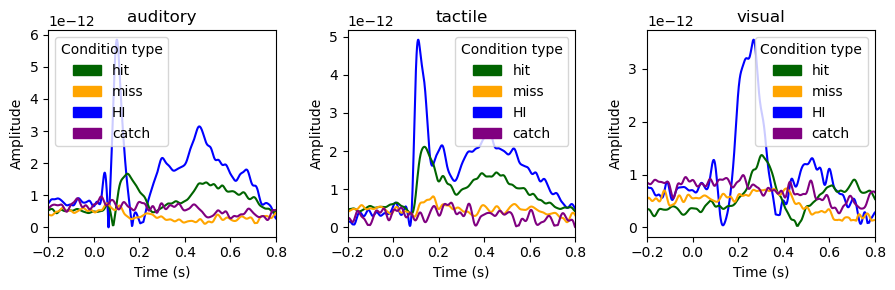

In [148]:
n_best = 2
ch_type = 'grad'
all_subj = os.listdir('/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/')
badSubj = ['20021027sldn']
fig, axes = mk_subplots(1, 3, False)

for n, (modality, mod_name) in enumerate(zip(conditions2, titles)):

	# ga_mod = mne.grand_average([evo[modality[0]] for evo in evoked if evo])

	ga_mod = mne.grand_average([evo[modality[0]] for evo, subjID in zip(evoked, all_subj) if (evo and subjID not in badSubj)])
	# get indices of best channels
	evoked_mod = ga_mod.copy().pick(ch_type)#.apply_function(np.abs)
	max_activity = np.max(np.abs( evoked_mod.data), axis=1)
	bestCh_idx = np.argsort(max_activity)[-n_best:]

	for n_cond, condition in enumerate(modality):
		# print(condition)

		ga_cond = mne.grand_average([evo[condition] for evo, subjID in zip(evoked, all_subj) if (evo and subjID not in badSubj)])
		ax = axes[n]
		thisColor = next((v for k, v in colors.items() if k in condition), None)

		plot_best_evoked(ga_cond, bestCh_idx, ax, color=thisColor, ch_type=ch_type, do_avg = False, use_abs = True)

	ax.set_title(mod_name)
	ax.set_xlabel('Time (s)')
	ax.set_ylabel('Amplitude')
	ax.set_xlim(-0.2, 0.8)

legend_handles = [mpatches.Patch(color=c, label=k) for k, c in colors.items()]
for ax in axes:
	ax.legend(handles=legend_handles, title='Condition type')

plt.tight_layout()
plt.show()

### GA ERP:  old vs. new subjects 

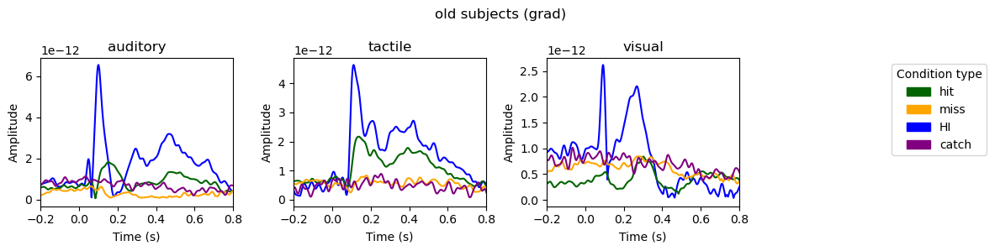

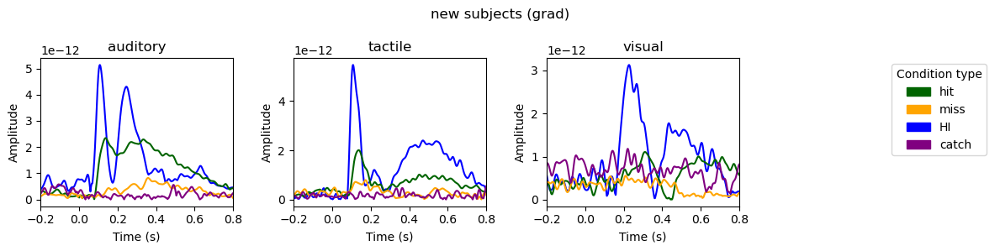

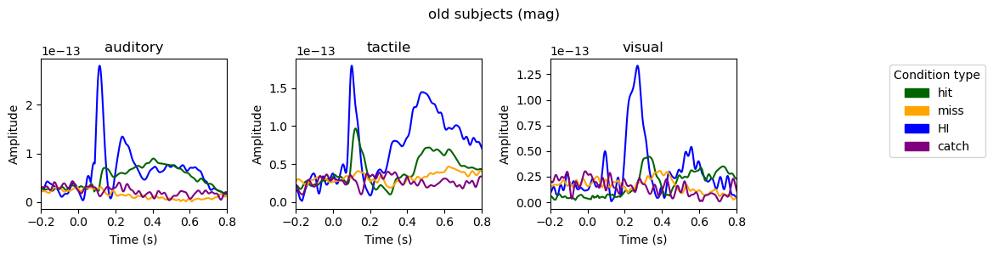

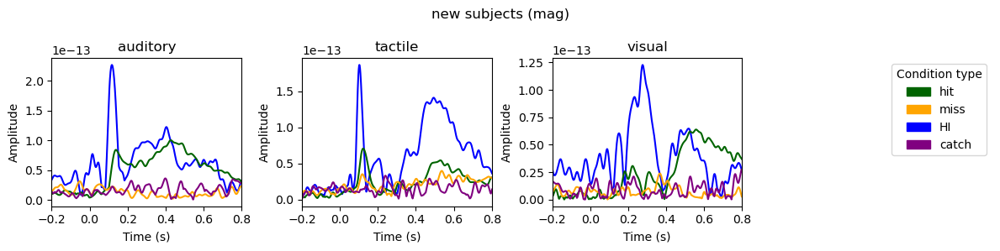

In [188]:
evoked = deepcopy(evoked_loaded)

all_subj = os.listdir('/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/') # <--- we need to kep this
old_s = [f.split('_', 1)[0] for f in os.listdir('/home/reabt/experiments/ncc/bursts/data/data_4000')]
new_s = ['20021027sldn', '20050610atbu', '20010917rswg', '19961123crsh', '20050204vrao', '19930306sbeh', '20070324hlti', '20000118sbnb', '19840930bigs', '19942803fbjm', '19921205crfi', '19970801cabd']

evoked_old, old_subj = zip(*[(evo, subID) for evo, subID in zip(evoked, all_subj) if subID in old_s]) # so we have the right order!
evoked_new, new_subj = zip(*[(evo, subID) for evo, subID in zip(evoked, all_subj) if subID in new_s])

from scipy.stats import zscore

n_best = 2
ch_type = 'grad'
all_subj = os.listdir('/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/')
badSubj = ['20021027sldn']
suptitles = ['old subjects', 'new subjects']

with warnings.catch_warnings():
	warnings.simplefilter("ignore")

	# suppress MNE logging (info, warning, etc.)
	with mne.use_log_level('ERROR'):  # only show critical errors

		for ch_type in ['grad', 'mag']:
			for sup, (evoked, these_subj) in enumerate(zip([evoked_old, evoked_new], [old_subj, new_subj])):
				fig, axes = mk_subplots(1, 4, False)
				fig.suptitle(f'{suptitles[sup]} ({ch_type})')

				for n, (modality, mod_name) in enumerate(zip(conditions2, titles)):

					# ga_mod = mne.grand_average([evo[modality[0]] for evo in evoked if evo])

					ga_mod = mne.grand_average([evo[modality[0]] for evo, subjID in zip(evoked, these_subj) if (evo and subjID not in badSubj)])
					# get indices of best channels
					evoked_mod = ga_mod.copy().pick(ch_type)#.apply_function(np.abs)
					max_activity = np.max(np.abs( evoked_mod.data), axis=1)
					bestCh_idx = np.argsort(max_activity)[-n_best:]

					for n_cond, condition in enumerate(modality):
						# print(condition)

						ga_cond = mne.grand_average([evo[condition] for evo, subjID in zip(evoked, these_subj) if (evo and subjID not in badSubj)])
						ax = axes[n]
						thisColor = next((v for k, v in colors.items() if k in condition), None)

						plot_best_evoked(ga_cond, bestCh_idx, ax, color=thisColor, ch_type=ch_type, do_avg = False, use_abs = True)

					ax.set_title(mod_name)
					ax.set_xlabel('Time (s)')
					ax.set_ylabel('Amplitude')
					ax.set_xlim(-0.2, 0.8)

				legend_handles = [mpatches.Patch(color=c, label=k) for k, c in colors.items()]
				# for ax in axes:
				# 	ax.legend(handles=legend_handles, title='Condition type')
				axes[3].axis('off')
				axes[3].legend(handles=legend_handles, title='Condition type')

				plt.tight_layout()
				plt.show()

### GA ERP:  old vs. new subjects - test: z-transform data before

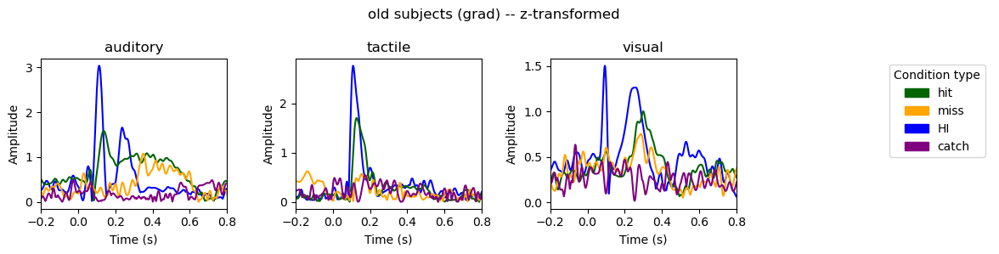

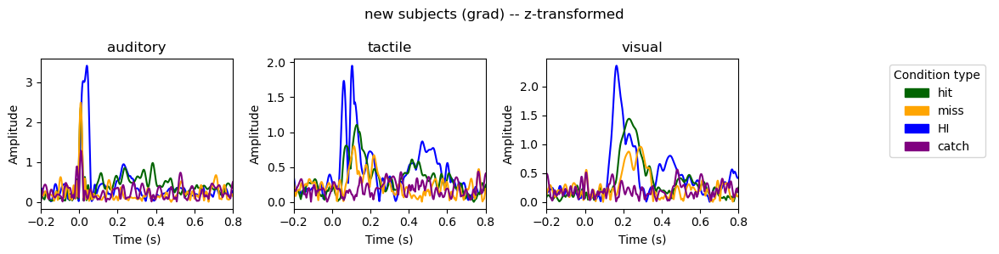

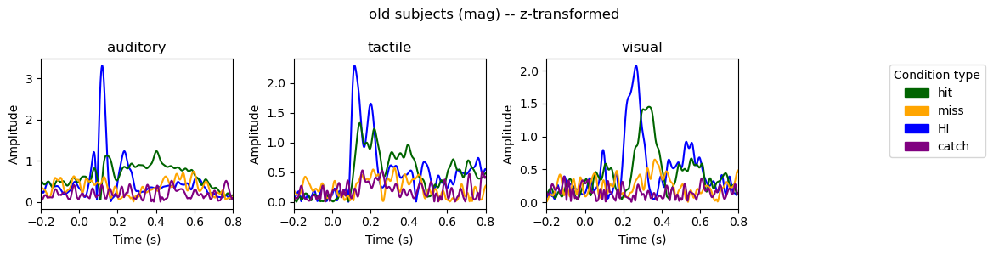

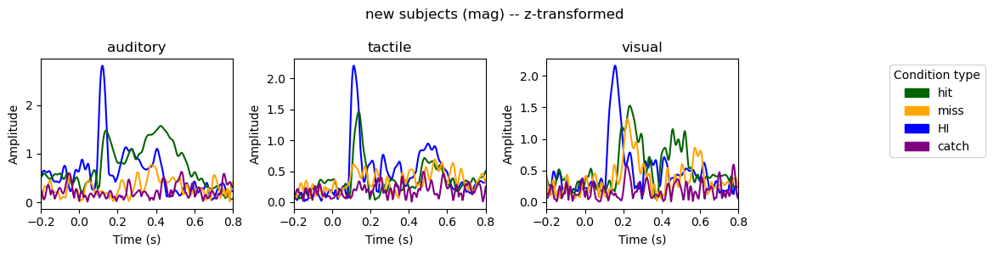

In [235]:
evoked = deepcopy(evoked_loaded)

all_subj = os.listdir('/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/') # <--- we need to kep this
old_s = [f.split('_', 1)[0] for f in os.listdir('/home/reabt/experiments/ncc/bursts/data/data_4000')]
new_s = ['20021027sldn', '20050610atbu', '20010917rswg', '19961123crsh', '20050204vrao', '19930306sbeh', '20070324hlti', '20000118sbnb', '19840930bigs', '19942803fbjm', '19921205crfi', '19970801cabd']

evoked_old, old_subj = zip(*[(evo, subID) for evo, subID in zip(evoked, all_subj) if subID in old_s]) # so we have the right order!
evoked_new, new_subj = zip(*[(evo, subID) for evo, subID in zip(evoked, all_subj) if subID in new_s])

from scipy.stats import zscore

n_best = 2
ch_type = 'grad'
all_subj = os.listdir('/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/')
badSubj = ['20021027sldn']
suptitles = ['old subjects', 'new subjects']

with warnings.catch_warnings():
	warnings.simplefilter("ignore")

	# suppress MNE logging (info, warning, etc.)
	with mne.use_log_level('ERROR'):  # only show critical errors

		for ch_type in ['grad', 'mag']:
			for sup, (evoked, these_subj) in enumerate(zip([evoked_old, evoked_new], [old_subj, new_subj])):
				fig, axes = mk_subplots(1, 4, False)
				fig.suptitle(f'{suptitles[sup]} ({ch_type}) -- z-transformed')

				for n, (modality, mod_name) in enumerate(zip(conditions2, titles)):

					# ga_mod = mne.grand_average([evo[modality[0]] for evo in evoked if evo])

					ga_mod = mne.grand_average([evo[modality[0]].apply_function(zscore) for evo, subjID in zip(evoked, these_subj) if (evo and subjID not in badSubj)])
					# get indices of best channels
					evoked_mod = ga_mod.copy().pick(ch_type)#.apply_function(np.abs)
					max_activity = np.max(np.abs( evoked_mod.data), axis=1)
					bestCh_idx = np.argsort(max_activity)[-n_best:]

					for n_cond, condition in enumerate(modality):
						# print(condition)
						if n_cond == 0:
							ga_cond = deepcopy(ga_mod) # we don't need to compute it again bewcause we already have it
						else:
							ga_cond = mne.grand_average([evo[condition].apply_function(zscore) for evo, subjID in zip(evoked, these_subj) if (evo and subjID not in badSubj)])
						ax = axes[n]
						thisColor = next((v for k, v in colors.items() if k in condition), None)

						plot_best_evoked(ga_cond, bestCh_idx, ax, color=thisColor, ch_type=ch_type, do_avg = False, use_abs = True)

					ax.set_title(mod_name)
					ax.set_xlabel('Time (s)')
					ax.set_ylabel('Amplitude')
					ax.set_xlim(-0.2, 0.8)

				legend_handles = [mpatches.Patch(color=c, label=k) for k, c in colors.items()]
				# for ax in axes:
				# 	ax.legend(handles=legend_handles, title='Condition type')
				axes[3].axis('off')
				axes[3].legend(handles=legend_handles, title='Condition type')

				plt.tight_layout()
				plt.show()

# topos

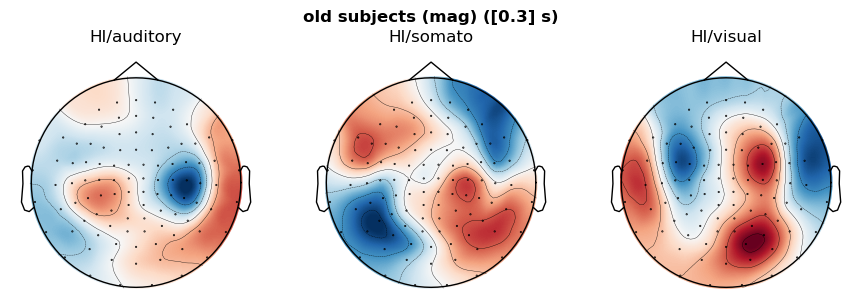

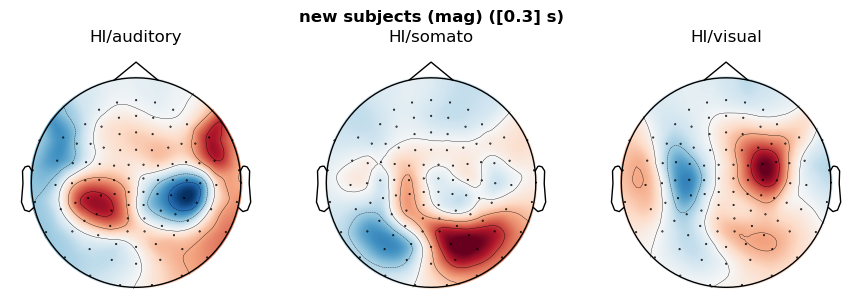

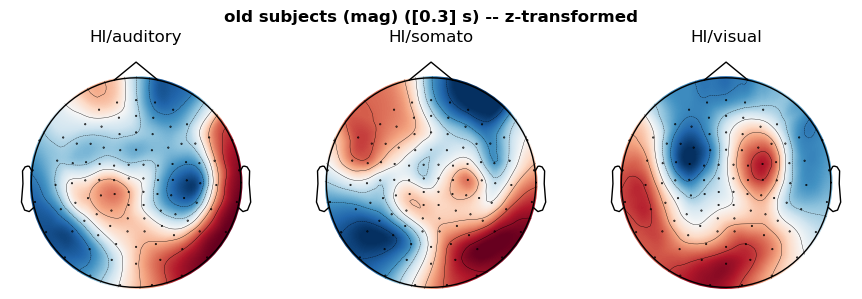

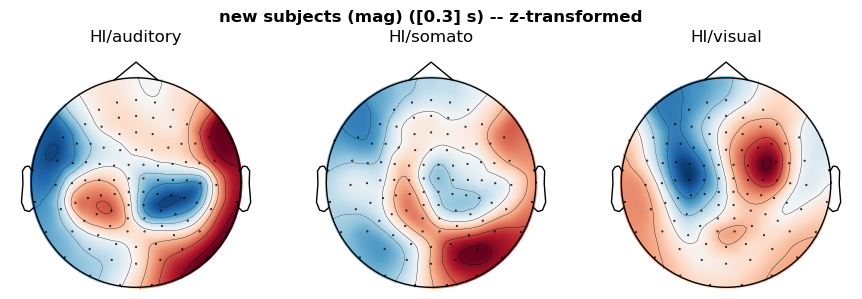

In [217]:
evoked_full = deepcopy(evoked_loaded)

all_subj = os.listdir('/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/') # <--- we need to kep this
old_s = [f.split('_', 1)[0] for f in os.listdir('/home/reabt/experiments/ncc/bursts/data/data_4000')]
new_s = ['20021027sldn', '20050610atbu', '20010917rswg', '19961123crsh', '20050204vrao', '19930306sbeh', '20070324hlti', '20000118sbnb', '19840930bigs', '19942803fbjm', '19921205crfi', '19970801cabd']

evoked_old, old_subj = zip(*[(evo, subID) for evo, subID in zip(evoked_full, all_subj) if subID in old_s]) # so we have the right order!
evoked_new, new_subj = zip(*[(evo, subID) for evo, subID in zip(evoked_full, all_subj) if subID in new_s])


times = [0.3]
ch_type = 'mag'

with warnings.catch_warnings():
	warnings.simplefilter("ignore")

	# suppress MNE logging (info, warning, etc.)
	with mne.use_log_level('ERROR'):  # only show critical errors
		for sup, (evoked, these_subj) in enumerate(zip([evoked_old, evoked_new], [old_subj, new_subj])):
			fig, axes = mk_subplots(1, 3, False)
			fig.suptitle(f'{suptitles[sup]} ({ch_type}) ({times} s)', fontweight = 'bold')

			for n, condition in enumerate(HI_conditions):   		
				ga_cond = mne.grand_average([evo[condition].copy() for evo, subjID in zip(evoked, these_subj) if (evo and subjID not in badSubj)])
				ax = axes[n]

				plot_eeg_topo(ga_cond, times, ax=axes[n], ch_pick = ch_type, use_average=False)	# EEG-style magnetometer
				ax.set_title(condition)
			plt.tight_layout()
			plt.show()

times = [0.3]
ch_type = 'mag'

with warnings.catch_warnings():
	warnings.simplefilter("ignore")

	# suppress MNE logging (info, warning, etc.)
	with mne.use_log_level('ERROR'):  # only show critical errors
		for sup, (evoked, these_subj) in enumerate(zip([evoked_old, evoked_new], [old_subj, new_subj])):
			fig, axes = mk_subplots(1, 3, False)
			fig.suptitle(f'{suptitles[sup]} ({ch_type}) ({times} s) -- z-transformed', fontweight = 'bold')

			for n, condition in enumerate(HI_conditions):   		
				ga_cond = mne.grand_average([evo[condition].copy().apply_function(zscore) for evo, subjID in zip(evoked, these_subj) if (evo and subjID not in badSubj)])
				ax = axes[n]

				plot_eeg_topo(ga_cond, times, ax=axes[n], ch_pick = ch_type, use_average=False)	# EEG-style magnetometer
				ax.set_title(condition)
			plt.tight_layout()
			plt.show()

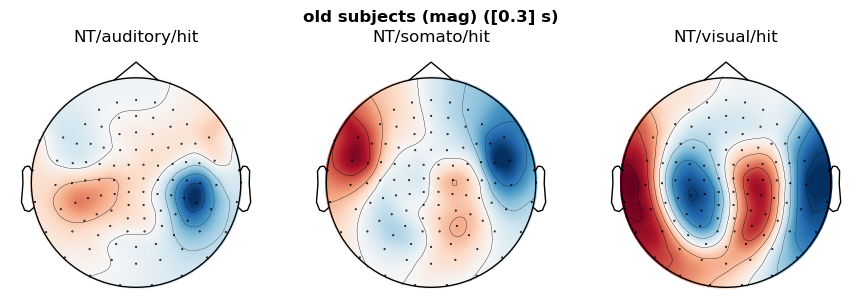

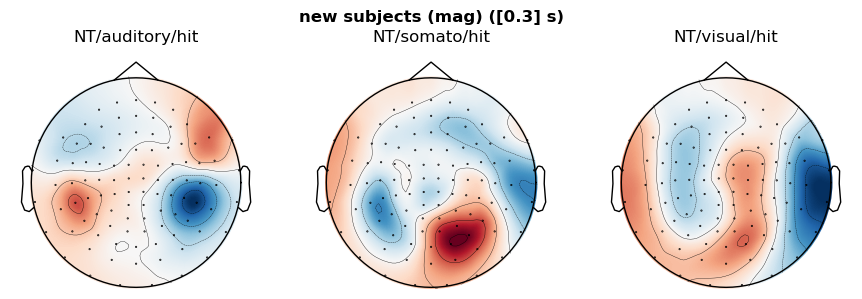

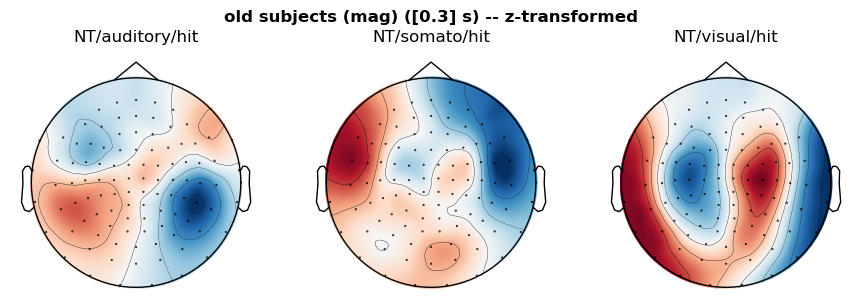

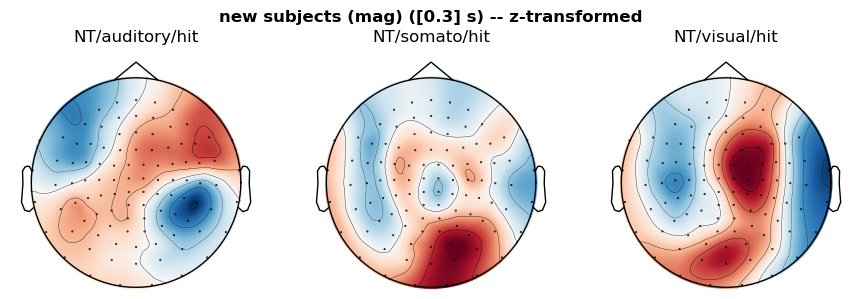

In [219]:
evoked = deepcopy(evoked_loaded)

all_subj = os.listdir('/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/') # <--- we need to kep this
old_s = [f.split('_', 1)[0] for f in os.listdir('/home/reabt/experiments/ncc/bursts/data/data_4000')]
new_s = ['20021027sldn', '20050610atbu', '20010917rswg', '19961123crsh', '20050204vrao', '19930306sbeh', '20070324hlti', '20000118sbnb', '19840930bigs', '19942803fbjm', '19921205crfi', '19970801cabd']

evoked_old, old_subj = zip(*[(evo, subID) for evo, subID in zip(evoked, all_subj) if subID in old_s]) # so we have the right order!
evoked_new, new_subj = zip(*[(evo, subID) for evo, subID in zip(evoked, all_subj) if subID in new_s])


times = [0.3]
ch_type = 'mag'

with warnings.catch_warnings():
	warnings.simplefilter("ignore")

	# suppress MNE logging (info, warning, etc.)
	with mne.use_log_level('ERROR'):  # only show critical errors
		for sup, (evoked, these_subj) in enumerate(zip([evoked_old, evoked_new], [old_subj, new_subj])):
			fig, axes = mk_subplots(1, 3, False)
			fig.suptitle(f'{suptitles[sup]} ({ch_type}) ({times} s)', fontweight = 'bold')

			for n, condition in enumerate(NT_hits):   		
				ga_cond = mne.grand_average([evo[condition].copy() for evo, subjID in zip(evoked, these_subj) if (evo and subjID not in badSubj)])
				ax = axes[n]

				plot_eeg_topo(ga_cond, times, ax=axes[n], ch_pick = ch_type, use_average=False)	# EEG-style magnetometer
				ax.set_title(condition)
			plt.tight_layout()
			plt.show()


times = [0.3]
ch_type = 'mag'

with warnings.catch_warnings():
	warnings.simplefilter("ignore")

	# suppress MNE logging (info, warning, etc.)
	with mne.use_log_level('ERROR'):  # only show critical errors
		for sup, (evoked, these_subj) in enumerate(zip([evoked_old, evoked_new], [old_subj, new_subj])):
			fig, axes = mk_subplots(1, 3, False)
			fig.suptitle(f'{suptitles[sup]} ({ch_type}) ({times} s) -- z-transformed', fontweight = 'bold')

			for n, condition in enumerate(NT_hits):   		
				ga_cond = mne.grand_average([evo[condition].copy().apply_function(zscore) for evo, subjID in zip(evoked, these_subj) if (evo and subjID not in badSubj)])
				ax = axes[n]

				plot_eeg_topo(ga_cond, times, ax=axes[n], ch_pick = ch_type, use_average=False)	# EEG-style magnetometer
				ax.set_title(condition)
			plt.tight_layout()
			plt.show()


### trying absolute values fpr topo plotting

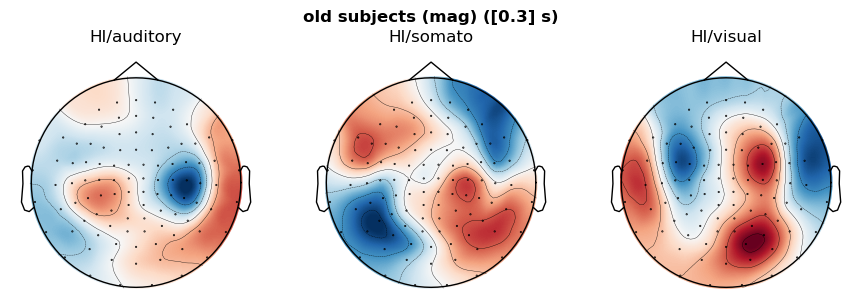

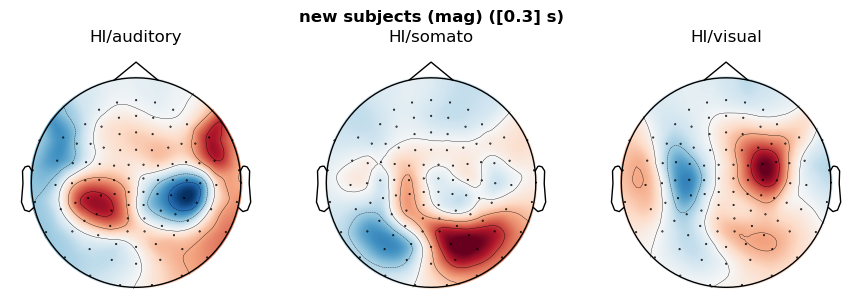

In [213]:
evoked = deepcopy(evoked_loaded)

all_subj = os.listdir('/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/') # <--- we need to kep this
old_s = [f.split('_', 1)[0] for f in os.listdir('/home/reabt/experiments/ncc/bursts/data/data_4000')]
new_s = ['20021027sldn', '20050610atbu', '20010917rswg', '19961123crsh', '20050204vrao', '19930306sbeh', '20070324hlti', '20000118sbnb', '19840930bigs', '19942803fbjm', '19921205crfi', '19970801cabd']

evoked_old, old_subj = zip(*[(evo, subID) for evo, subID in zip(evoked, all_subj) if subID in old_s]) # so we have the right order!
evoked_new, new_subj = zip(*[(evo, subID) for evo, subID in zip(evoked, all_subj) if subID in new_s])


def plot_eeg_topo2(epochs, times, ax, ch_pick = 'mag', use_average = True, use_abs = False):
	with warnings.catch_warnings():
		warnings.simplefilter("ignore")
		# suppress MNE logging (info, warning, etc.)
		with mne.use_log_level('ERROR'):  # only show critical errors

			evoked = epochs.copy().pick(ch_pick)

			if use_average:
				evoked = evoked.average()
			# if use_abs:
			# 	print('using absulute values')
			# 	evoked = evoked.apply_function(np.abs)
			
			evoked.set_channel_types(dict(zip(evoked.ch_names, np.tile('eeg', len(evoked.ch_names)))), verbose=False)
			evoked.plot_topomap(
				times=times,
				axes=ax,
				ch_type="eeg",          # plot one sensor type only
				show=False,
				colorbar=False,
				outlines="head",        # try "head" instead of helmet-like outlines
				extrapolate="head",     # constrain interpolation to the head outline
				contours=6,
				sphere=0.17
			)

times = [0.3]
ch_type = 'mag'

with warnings.catch_warnings():
	warnings.simplefilter("ignore")

	# suppress MNE logging (info, warning, etc.)
	with mne.use_log_level('ERROR'):  # only show critical errors
		for sup, (evoked, these_subj) in enumerate(zip([evoked_old, evoked_new], [old_subj, new_subj])):
			fig, axes = mk_subplots(1, 3, False)
			fig.suptitle(f'{suptitles[sup]} ({ch_type}) ({times} s)', fontweight = 'bold')

			for n, condition in enumerate(HI_conditions):   		
				ga_cond = mne.grand_average([evo[condition] for evo, subjID in zip(evoked, these_subj) if (evo and subjID not in badSubj)])
				ax = axes[n]

				plot_eeg_topo2(ga_cond, times, ax=axes[n], ch_pick = ch_type, use_average=False)	# EEG-style magnetometer
				ax.set_title(condition)
			plt.tight_layout()
			plt.show()



## trying to plot  the gradiometers

Hits

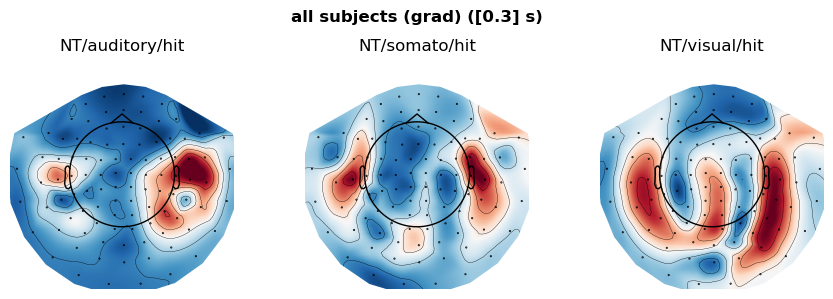

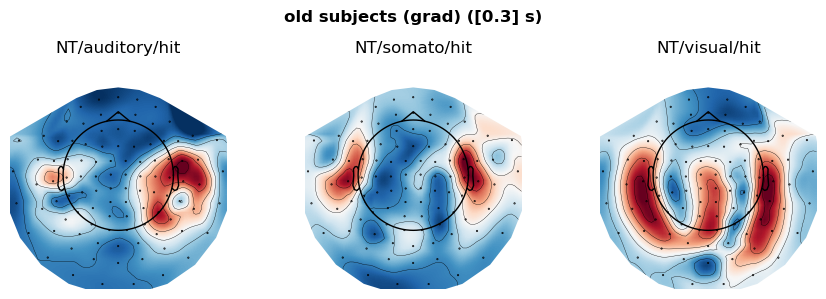

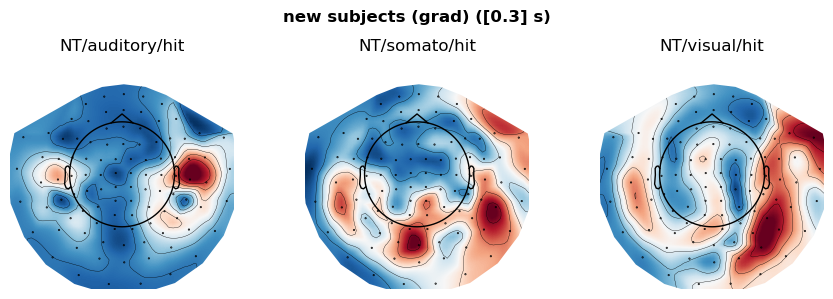

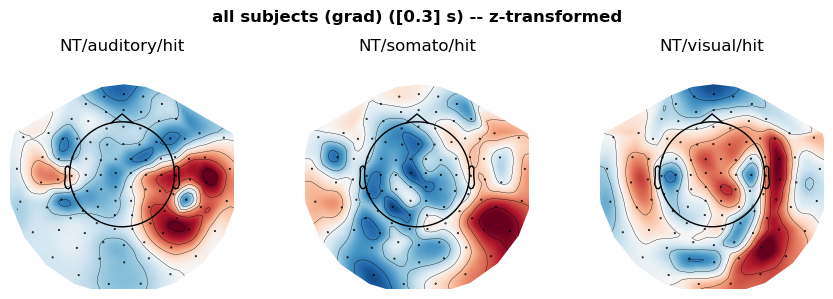

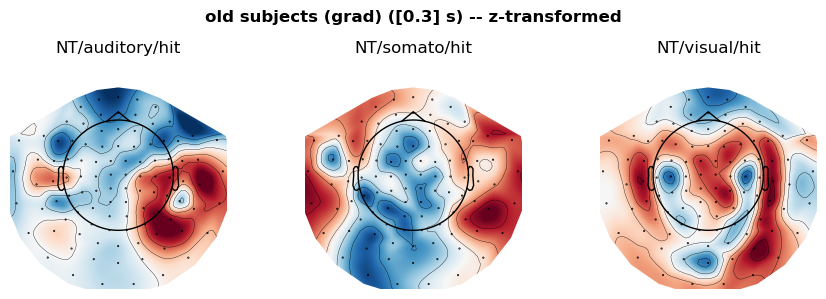

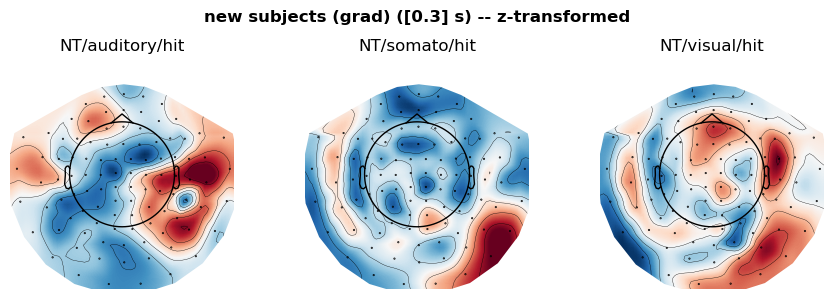

In [228]:
evoked_all = deepcopy(evoked_loaded)

all_subj = os.listdir('/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/') # <--- we need to keep the order of this subject list
old_s = [f.split('_', 1)[0] for f in os.listdir('/home/reabt/experiments/ncc/bursts/data/data_4000')]
new_s = ['20021027sldn', '20050610atbu', '20010917rswg', '19961123crsh', '20050204vrao', '19930306sbeh', '20070324hlti', '20000118sbnb', '19840930bigs', '19942803fbjm', '19921205crfi', '19970801cabd']

evoked_old, old_subj = zip(*[(evo, subID) for evo, subID in zip(evoked_all, all_subj) if subID in old_s]) # so we have the right order!
evoked_new, new_subj = zip(*[(evo, subID) for evo, subID in zip(evoked_all, all_subj) if subID in new_s])

suptitles = ['all subjects', 'old subjects', 'new subjects']

times = [0.3]
ch_type = 'grad'

with warnings.catch_warnings():
	warnings.simplefilter("ignore")

	# suppress MNE logging (info, warning, etc.)
	with mne.use_log_level('ERROR'):  # only show critical errors
		for sup, (evoked, these_subj) in enumerate(zip([evoked_all, evoked_old, evoked_new], [all_subj, old_subj, new_subj])):
			fig, axes = mk_subplots(1, 3, False)
			fig.suptitle(f'{suptitles[sup]} ({ch_type}) ({times} s)', fontweight = 'bold')

			for n, condition in enumerate(NT_hits):   		
				ga_cond = mne.grand_average([evo[condition].copy() for evo, subjID in zip(evoked, these_subj) if (evo and subjID not in badSubj)])
				ax = axes[n]

				plot_meg_topo(ga_cond, times, ax=axes[n], ch_pick = ch_type, use_average=False)	# EEG-style magnetometer
				ax.set_title(condition)
			plt.tight_layout()
			plt.show()


		for sup, (evoked, these_subj) in enumerate(zip([evoked_all, evoked_old, evoked_new], [all_subj, old_subj, new_subj])):
			fig, axes = mk_subplots(1, 3, False)
			fig.suptitle(f'{suptitles[sup]} ({ch_type}) ({times} s) -- z-transformed', fontweight = 'bold')

			for n, condition in enumerate(NT_hits):   		
				ga_cond = mne.grand_average([evo[condition].copy().apply_function(zscore) for evo, subjID in zip(evoked, these_subj) if (evo and subjID not in badSubj)])
				ax = axes[n]

				plot_meg_topo(ga_cond, times, ax=axes[n], ch_pick = ch_type, use_average=False)	# EEG-style magnetometer
				ax.set_title(condition)
			plt.tight_layout()
			plt.show()

High intensity

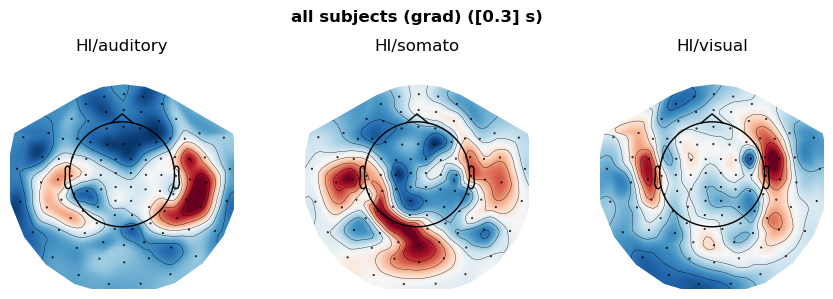

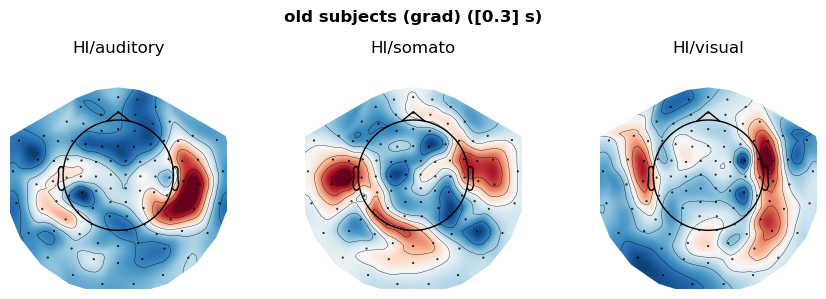

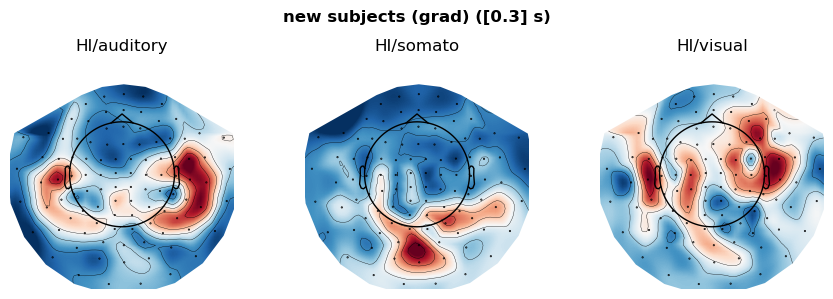

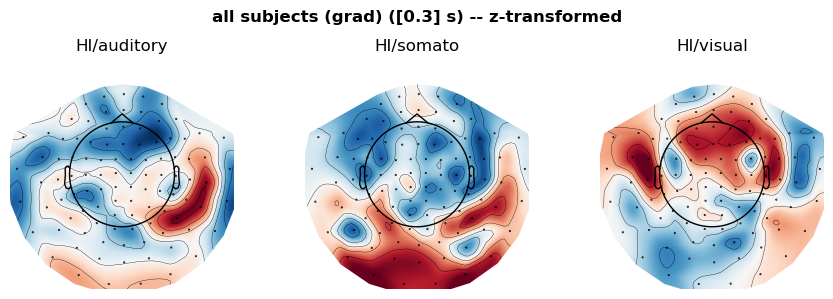

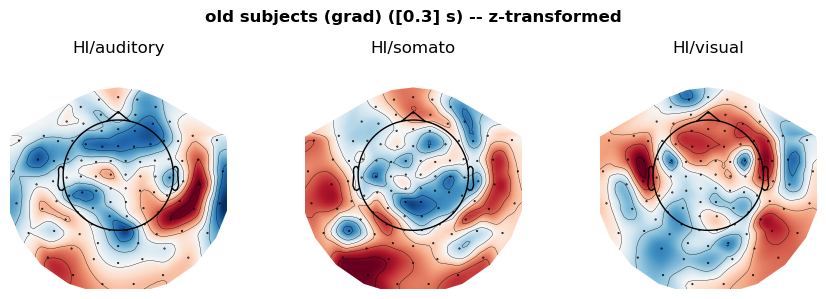

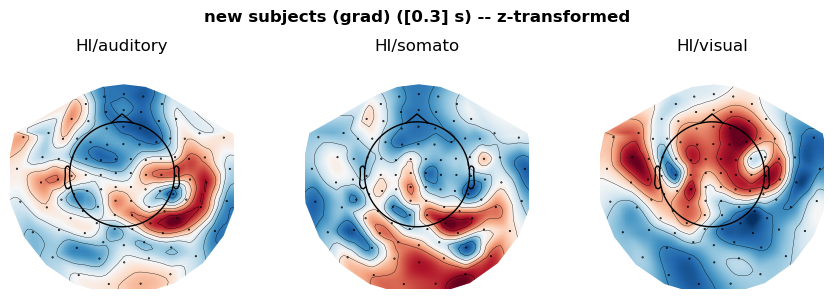

In [234]:
evoked_all = deepcopy(evoked_loaded)

all_subj = os.listdir('/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/') # <--- we need to keep the order of this subject list
old_s = [f.split('_', 1)[0] for f in os.listdir('/home/reabt/experiments/ncc/bursts/data/data_4000')]
new_s = ['20021027sldn', '20050610atbu', '20010917rswg', '19961123crsh', '20050204vrao', '19930306sbeh', '20070324hlti', '20000118sbnb', '19840930bigs', '19942803fbjm', '19921205crfi', '19970801cabd']

evoked_old, old_subj = zip(*[(evo, subID) for evo, subID in zip(evoked_all, all_subj) if subID in old_s]) # so we have the right order!
evoked_new, new_subj = zip(*[(evo, subID) for evo, subID in zip(evoked_all, all_subj) if subID in new_s])

suptitles = ['all subjects', 'old subjects', 'new subjects']

times = [0.3]
ch_type = 'grad'

with warnings.catch_warnings():
	warnings.simplefilter("ignore")

	# suppress MNE logging (info, warning, etc.)
	with mne.use_log_level('ERROR'):  # only show critical errors
		for sup, (evoked, these_subj) in enumerate(zip([evoked_all, evoked_old, evoked_new], [all_subj, old_subj, new_subj])):
			fig, axes = mk_subplots(1, 3, False)
			fig.suptitle(f'{suptitles[sup]} ({ch_type}) ({times} s)', fontweight = 'bold')

			for n, condition in enumerate(HI_conditions):   		
				ga_cond = mne.grand_average([evo[condition].copy() for evo, subjID in zip(evoked, these_subj) if (evo and subjID not in badSubj)])
				ax = axes[n]

				plot_meg_topo(ga_cond, times, ax=axes[n], ch_pick = ch_type, use_average=False)	# EEG-style magnetometer
				ax.set_title(condition)
			plt.tight_layout()
			plt.show()


		for sup, (evoked, these_subj) in enumerate(zip([evoked_all, evoked_old, evoked_new], [all_subj, old_subj, new_subj])):
			fig, axes = mk_subplots(1, 3, False)
			fig.suptitle(f'{suptitles[sup]} ({ch_type}) ({times} s) -- z-transformed', fontweight = 'bold')

			for n, condition in enumerate(HI_conditions):   		
				ga_cond = mne.grand_average([evo[condition].copy().apply_function(zscore) for evo, subjID in zip(evoked, these_subj) if (evo and subjID not in badSubj)])
				ax = axes[n]

				plot_meg_topo(ga_cond, times, ax=axes[n], ch_pick = ch_type, use_average=False)	# EEG-style magnetometer
				ax.set_title(condition)
			plt.tight_layout()
			plt.show()

### all Topos - HI

old SUbjects

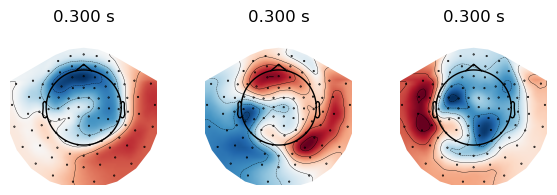

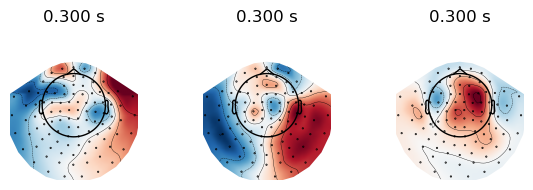

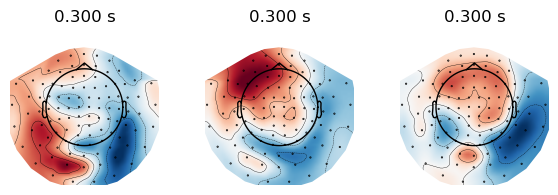

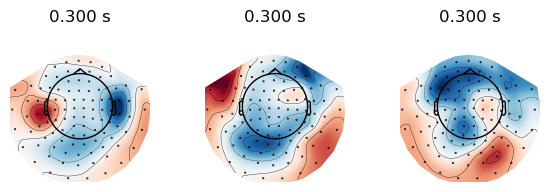

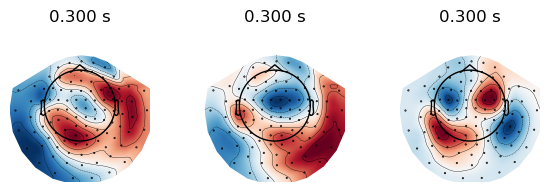

...

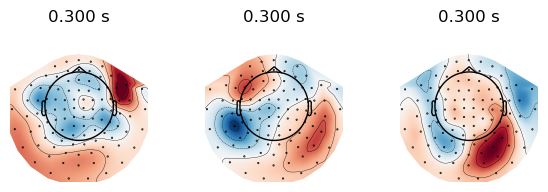

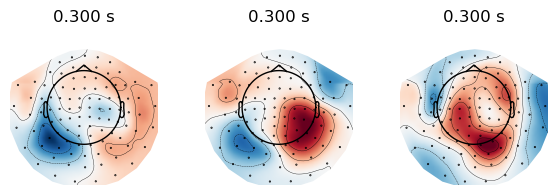

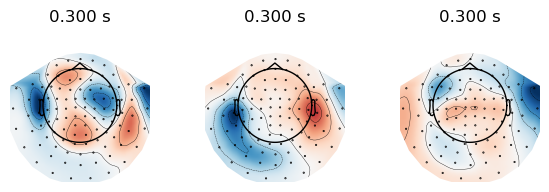

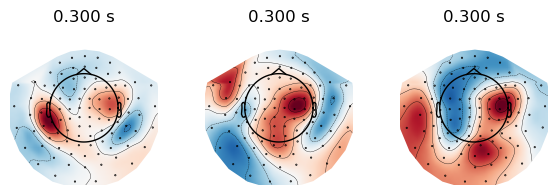

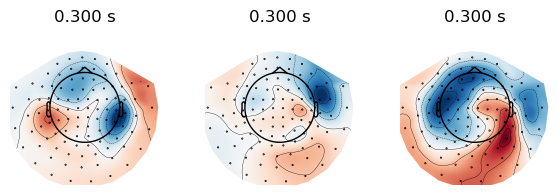

In [232]:

for subj, subjID in zip(evoked_old, old_subj):
	if subj and subj not in badSubj:
		fig, axes = mk_subplots(1, 3, False, sz = [2, 2]) #rows = len(times) # +1 (only if colorbar = True)
		for n, condition in enumerate(HI_conditions):    
			plot_meg_topo(subj[condition], times, ax=axes[n], ch_pick = 'mag', use_average=False)	# EEG-style magnetometer

		plt.tight_layout()
		plt.show()

new subjects

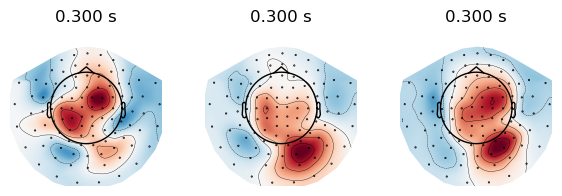

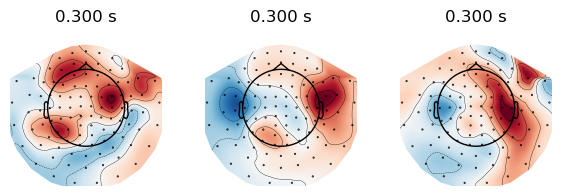

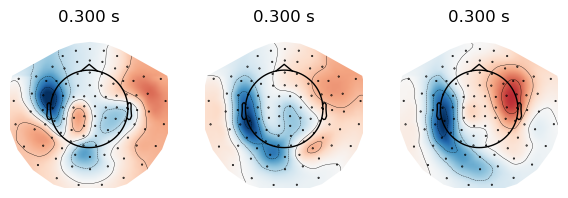

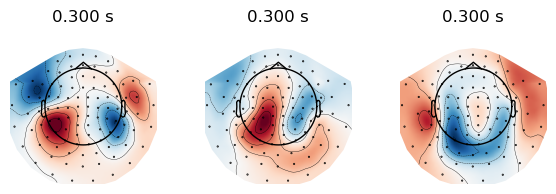

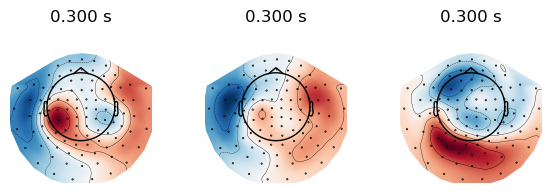

...

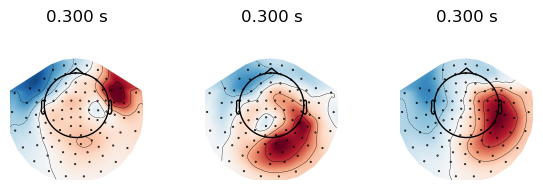

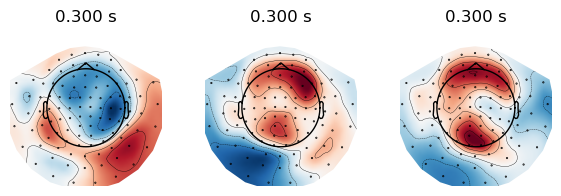

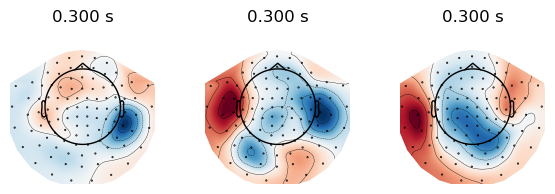

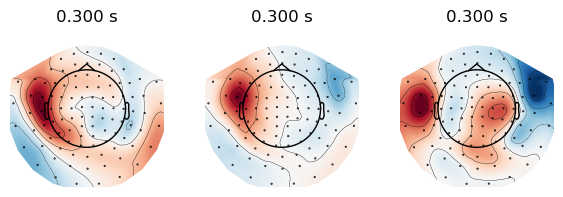

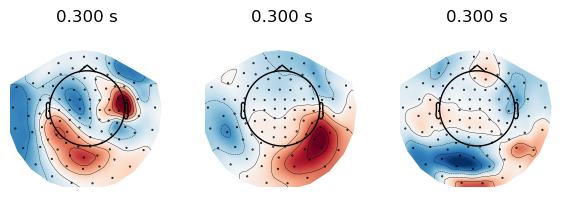

In [233]:

for subj, subjID in zip(evoked_new, new_subj):
	if subj and subj not in badSubj:
		fig, axes = mk_subplots(1, 3, False, sz = [2, 2]) #rows = len(times) # +1 (only if colorbar = True)
		for n, condition in enumerate(HI_conditions):    
			plot_meg_topo(subj[condition], times, ax=axes[n], ch_pick = 'mag', use_average=False)	# EEG-style magnetometer

		plt.tight_layout()
		plt.show()

In [ ]:
all_evoked = [mne.combine_evoked(
    [evo[k] for k in evo.keys()],[1 for i in  evo.keys()])
     for evo in evoked if evo]

In [103]:
all_subj = os.listdir('/home/reabt/experiments/ncc/MEG/data/epochs_all_conditions/')
all_subj.index('19970801cabd')

28